<a href="https://colab.research.google.com/github/TsabarM/ODSC_hackathon_2020/blob/final_submission/ODSC_Hackathon_notebook%20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#ODSC 2020 Hackathon

In this notebook, I present my analysis and model on the ODSC 2020 Hackathon's data set.
The problem in question: Is it possible to predict the temperature of an electric motor. 
The participants in the hackathon are asked to predict the temperature of 4 parts in an electric motor. 
Overheating can cause severe malfunction. installing physical sensors is not economical. A machine learning model can be accurate and economical.
The participants are asked to predict these 4 dependent variables:    

*   pm - Permanent Magnet surface temperature (the rotor temperature) – measured with an infrared thermography unit.
*   stator_yoke - Stator yoke temperature – measured by a thermal sensor.
*   stator_tooth - Stator tooth temperature – measured by a thermal sensor.
*   stator_winding - Stator winding temperature – measured by a thermal sensor.

All variables (features) were standerdized. 

The final model is a fully connected network.    
The final RMSE result is:      
**2.043604214 total RMSE**   
RMSE_pm = 1.011369259   
RMSE_stator_yoke = 0.192175924   
RMSE_stator_tooth = 0.36982214   
RMSE_stator_winding = 0.470236891   



I used this excellent explanation to understand a little bit on electric motors:    
https://www.youtube.com/watch?v=ZMr_F2z9_Ow

I used this document to understand how to work with DQ components:   
https://onlinelibrary.wiley.com/doi/pdf/10.1002/9781118846704.app2

# Setup

In [62]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [63]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.cm as cm
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error as rmse

##Loading the data

In [64]:
train = pd.read_csv('/content/drive/My Drive/ODSC/train_set.csv')
test = pd.read_csv('/content/drive/My Drive/ODSC/test_set.csv')
test_solutions = pd.read_csv('/content/drive/My Drive/ODSC/test_solutions.csv')
test = pd.merge(test, test_solutions, left_index=True, right_index=True)

###Checks
Check for missing values and the variables data types to see if any preproceesing is needed.

In [65]:
def check_missing(df):
  try:
    df.name =[x for x in globals() if globals()[x] is df][0]
    if sum(df.isnull().sum()) == 0:
      print(f"None of the columns in {df.name} have missing data.")
  except:
    print(df.isnull().any())

In [66]:
check_missing(train)
check_missing(test)

None of the columns in train have missing data.
None of the columns in test have missing data.


In [67]:
train.dtypes

ambient           float64
coolant           float64
u_d               float64
u_q               float64
motor_speed       float64
torque            float64
i_d               float64
i_q               float64
pm                float64
stator_yoke       float64
stator_tooth      float64
stator_winding    float64
profile_id          int64
dtype: object

# Preprocessing and Analysis

In order to keep my analysis unbiased by the test results, I have based my analysis and conclusions on the training set.
Whenever I use the test set it is done only on the independent variables and without the temperture variables (dependent variables).

##Functions
1) The first thing that was clear to me is that I need to use the d and q components of the voltage and current together somehow. Reading [this explanation](https://onlinelibrary.wiley.com/doi/pdf/10.1002/9781118846704.app2) about d/q representation was the source for creating the "phase angle" and the "absolute" (and log_absolute) variables of the voltage and the current. 
The Next function calculates the new features based on the d/q components.   
   
2) Correlation - A function for pearson correlation heatmap between variables. 

In [9]:
# Feature Engineering for Volatge and Current  - Flattening the d and q components with absolute value and calculating the phase angle

def voltage_and_current_feature_engineering(d_component, q_component, df, i_or_u = 'u'):
  ''' 
  Calculates new variables from the d and q components:
  the magnitude, log of the magnitude and the phase angle.
  Re-arrange the columns so that the target variables (temperature variables)
  will the last columns in the dataframe.
  
  Arguments:
    d_component -- {int} -- Voltage / Current d-component
    q_component -- {int} -- Voltage / Current q-component
    df -- {DataFrame} -- the dataframe in which the new features will be stored
    i_or_u -- {str} -- 'u' or 'i' symbols volatge and current accordingly. Default: 'u'.

  Returns:
    The given dataframe with the new features.
  '''
       
  df[i_or_u]=d_component + q_component * 1j
  df[i_or_u + '_abs']=np.abs(df[i_or_u])
  df[i_or_u + '_q_d_ratio'] = q_component / d_component
  df[i_or_u + '_phase_angle'] = np.arctan(df[i_or_u + '_q_d_ratio'])
  df['log_'+ i_or_u + '_abs']=np.log(np.abs(df[i_or_u]))
  df = df[[c for c in df if c not in ['pm', 'stator_yoke', 'stator_tooth', 'stator_winding']] 
       + ['pm', 'stator_yoke', 'stator_tooth', 'stator_winding']]
  return df

In [10]:
def correlation_heatmap(df, fmt = '.1g', columns_to_exclude = False):
  ''' 
  Creates a pearson correlation heatmap. 
  Presents only the lower triangle of the heatmap. 
  
  Arguments:
    df -- {DataFrame} -- the dataframe for the heatmap
    fmt -- {str} -- number of decimal places, for example '.1g' or '.2g'.  Default: '.1g'.
    columns_to_exclude -- {lst} -- string list of the columns to exclude from the heatmap. Default: False.
        
  Returns:
    correlation heatmap.
  '''
  fig, ax = plt.subplots(figsize=(15,15))
  if columns_to_exclude == False:
    matrix = np.triu(df.corr())
    sns.heatmap(df.corr(), annot = True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', linewidths=3, linecolor='black', mask=matrix, ax=ax)
  else:
    matrix = np.triu(df.drop(columns_to_exclude, axis=1).corr())
    sns.heatmap((df.drop(columns_to_exclude, axis=1)).corr(), annot = True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', linewidths=3, linecolor='black', mask=matrix,  ax=ax)
  

##Preprocessing

In [68]:
# Adding the new voltage and current variables

train = voltage_and_current_feature_engineering(train['u_d'], train['u_q'], train, 'u')
train = voltage_and_current_feature_engineering(train['i_d'], train['i_q'], train, 'i')
test = voltage_and_current_feature_engineering(test['u_d'], test['u_q'], test, 'u')
test = voltage_and_current_feature_engineering(test['i_d'], test['i_q'], test, 'i')

In [13]:
list(train.columns)

['ambient',
 'coolant',
 'u_d',
 'u_q',
 'motor_speed',
 'torque',
 'i_d',
 'i_q',
 'profile_id',
 'u',
 'u_abs',
 'u_q_d_ratio',
 'u_phase_angle',
 'log_u_abs',
 'i',
 'i_abs',
 'i_q_d_ratio',
 'i_phase_angle',
 'log_i_abs',
 'pm',
 'stator_yoke',
 'stator_tooth',
 'stator_winding']

##Descriptive Statistics

In [55]:
train.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,profile_id,u,u_abs,u_q_d_ratio,u_phase_angle,log_u_abs,i,i_abs,i_q_d_ratio,i_phase_angle,log_i_abs,pm,stator_yoke,stator_tooth,stator_winding
count,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000+0.000000j,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000+0.000000j,846368.000000,8.463680e+05,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000
mean,0.082853,0.027152,0.052589,0.003834,-0.010858,-0.041547,0.026560,-0.040897,50.608782,0.052589+0.003834j,1.339636,-1.477027,-0.337409,0.211441,0.026560-0.040897j,1.275515,3.673913e+01,-0.037168,0.129908,-0.000441,0.012695,0.000753,-0.008259
std,0.977933,1.016069,0.996975,0.999539,1.000756,1.000715,0.987589,1.000951,23.079908,1.411750+0.000000j,0.448544,941.583550,0.913951,0.455539,1.406142+0.000000j,0.593864,3.392333e+04,0.790492,0.511023,0.991628,1.015148,1.006694,0.997647
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.239020,-3.345953,-3.245874,-3.341639,4.000000,-1.655373-1.214851j,0.002882,-784850.191183,-1.570795,-5.849157,-3.245874-2.389300j,0.000822,-1.870778e+05,-1.570791,-7.103359,-2.628648,-1.834688,-2.066143,-2.019973
25%,-0.345336,-1.040140,-0.787199,-0.916409,-0.951889,-0.365100,-0.750257,-0.362148,30.000000,-0.787199+1.241232j,1.145498,-3.602054,-1.299997,0.135840,-0.750257-0.254400j,0.990078,-4.461250e-01,-0.419627,-0.009971,-0.656185,-0.736750,-0.761951,-0.723910
50%,0.339621,-0.139105,0.292743,-0.085806,-0.140247,-0.237407,0.254701,-0.245697,56.000000,0.292743+0.726367j,1.359530,-0.520710,-0.480078,0.307139,0.254701+0.174207j,1.058085,-2.387540e-01,-0.234366,0.056460,0.083156,-0.052310,0.012339,0.009469
75%,0.688248,0.717035,0.404600,0.844942,0.844814,0.472951,1.013977,0.486917,68.000000,0.404600-0.441065j,1.661648,0.387675,0.369836,0.507810,1.013977-0.091446j,1.520760,5.937565e-01,0.535816,0.419210,0.684179,0.728644,0.778085,0.707115
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,81.000000,2.274734-1.173060j,2.912992,241462.477051,1.570792,1.069181,1.060937-0.258079j,4.030440,3.120639e+07,1.570796,1.393876,2.917456,2.449158,2.302169,2.653781


The temperature target variables are between (-3, 3).    
It seems that all variables are standerdized (mean=0, std=1).    
The maximum and minimum values are very "far" , it indicates that the variables distributions have a long tails. It mean that it will be difficult to predict the temperature values that are in the edges of the distribution (extremely hot or cold).

##Correlation Analysis

Check for person correlation between the variables inthe dataset

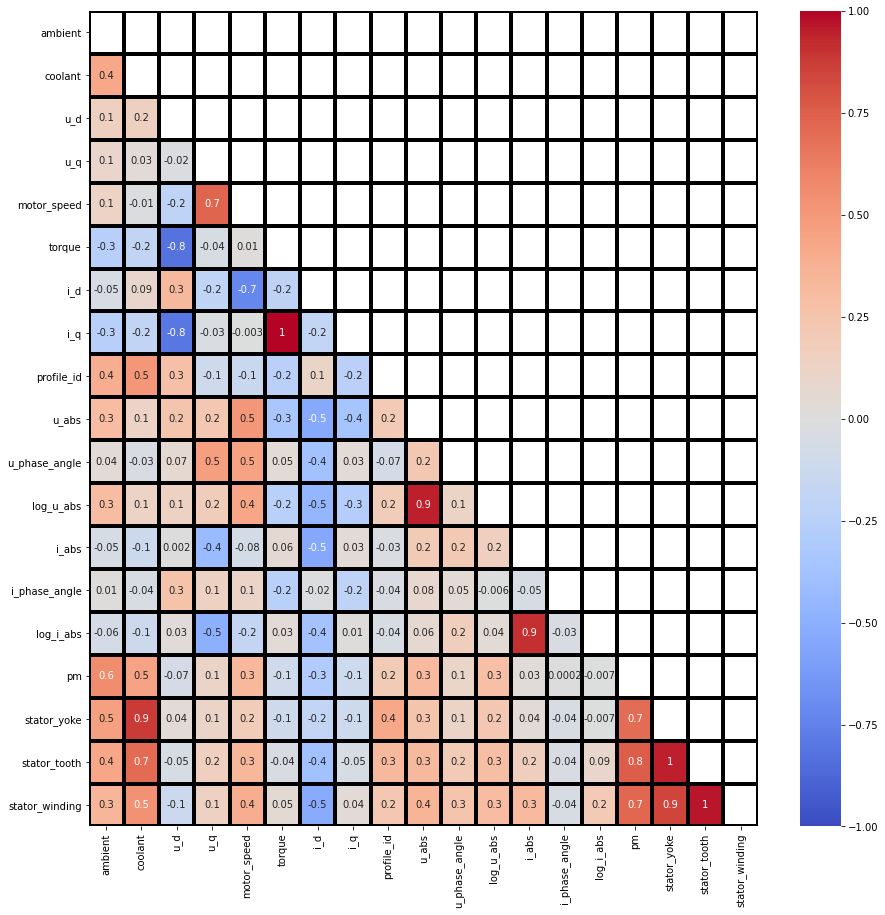

In [14]:
correlation_heatmap(train, columns_to_exclude = ['u_q_d_ratio', 'i_q_d_ratio', 'u', 'i'])

Conclusions from the correlation heatmap:

1.   There is a strong\perfect correlation between the target (depndent) variables: pm, stator_yoke, stator_tooth, stator_winding.
2.   Among the independent variables, the ambient, coolant, motor speed, u_abs, i_abs, and u_phase_angle    
have relativly stronger correlation to the dependent variables (pm, stator_yoke, stator_tooth, stator_winding).
3.   There is a correlation between the profile_id an the depndent variables. This might be taken into account in model as control variables. - The problem with profile_id is that it is not available in the test set. There is a correlation between the measurments and therfore the profile_id is important. There are different ways to deal with a catgorical variables such as profile_id.I've tried two ways (not shown in this notebook): 
1) Dummy variables - create a dummy variable for each profile_id.
2) Target Encoding -  replace the category with the realtive frequncy of the category in the data set. 
*I tried to deal with the profile_idThe model results weren't better, the model overfitted the training set and therfore I left this issue unsolved due to time considertaions.*
4.   There is a noticeable correlation between the following indepndent variables :
*   u_abs and motor speed
*   prfile_id and ambient
*   prfile_id and coolant
*   u_d and torque
*   i_q and torque - **full colinearity**
*   u_q and motor_speed
*   i_d and motor_speed
*   u_d and i_q

The first conclusion from the heatmap leads to the idea of "gradual" model. Meaning that at first the model predicts one of the temperature variables, and than it uses this prediction to retrain the model and predict the other temperature variables. 
In reality, this means that it is enough to predict only one of the motor components in order to have a good assesment of all other motor's components.

##Pairplots and Histograms

Correlation can gives a good sense of the relations between the different variables. Eventhough, it may misslead and it is necessary to see the scatter plots of each pair of variables.    
*It may be more convenient to watch the next plot in the PNG file I have added to this repository "pairplot.png".*

/usr/local/lib/python3.6/dist-packages/pandas/core/dtypes/cast.py:897: ComplexWarning: Casting complex values to real discards the imaginary part
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:854: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
/usr/local/lib/python3.6/dist-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)
/usr/local/lib/python3.6/dist-packages/matplotlib/transforms.py:1969: ComplexWarning: Casting complex values to real discards the imaginary part
  x, y = float(x), float(y)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:138: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order, subok=True)


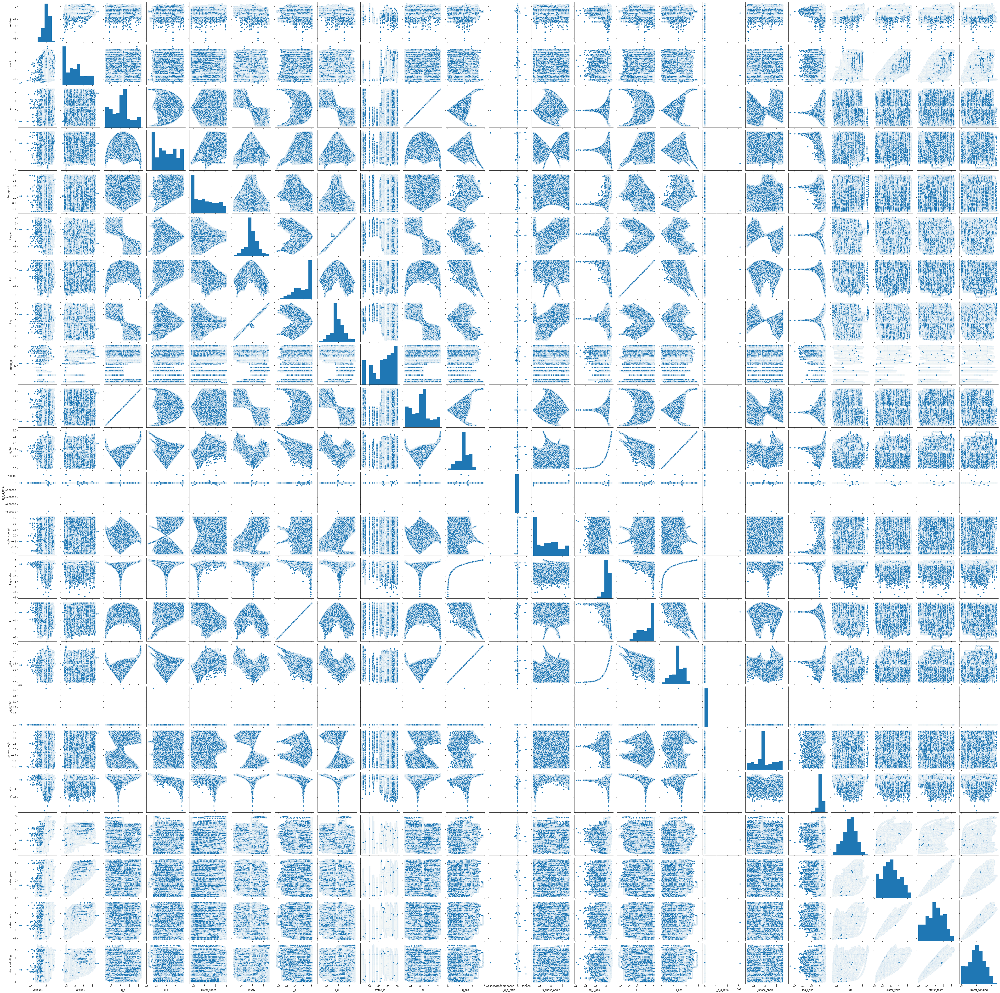

In [ ]:
sns.pairplot(train)

Main conclusions from the pairplots and histograms:


1.   Out of the 4 temperature target variables, only 'pm' have a bell shape "Normal" distribution.
2.   The other temperature variables have skewed and heavy tails distributions.
3.   It is very noticeable that some of the scatter plots present symmetrical/cyclic patterns. The explanation for that is that these scatter plots are the ones that at least one of the variables is related to the current or the voltage. 
3.   In the number of histograms of the independent variables (features), there is a prominent range that sticks up. Later in this notebook, I added dummy variables to the models that indicate if an observation (row) is in the prominent range. 
4.   Relations between the dependent and independent variables - except for  'coolant', all other variables do not show any clear pattern or direction when plotted against the dependent variables.  this may suggest that the correlation in the heatmap is a false correlation, or that the correlation is mediated through other confounding variables. 

####A closer look on some of the scatter plots:   
I added to the 2D scatter plots another dimension by using color bar for each observations which represents the measured temperature ('pm'). It show that the patterns in the scatter plots are also related to the temperature. 

#####**'torque' aginst 'u_abs' with 'pm' temperature**
The scatter plot presents a symmetrical "V" shape. It seems that the extremely hot temperature observations are more present on the edge of the positive (right) wing. 
I simply chose to create a dummy variable which indicates whether an observation is in the left or right-wing of the V shape. To do that I have calculated the minimum value of 'u_abs'.

In [43]:
train_extreme = train[(train['pm']>2)|(train['pm']<-2)]
train_extreme_hot = train[train['pm']>2]

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


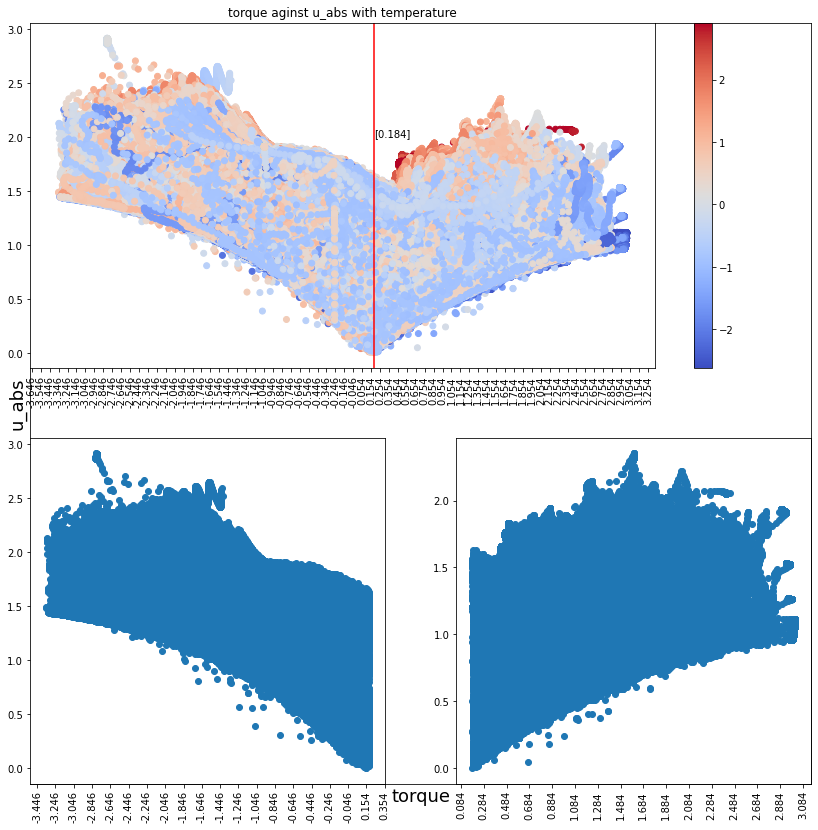

In [18]:
fig = plt.figure(figsize=(14,14), frameon = False)
fig.tight_layout(pad=3.0)
plt.ylabel('u_abs', fontsize = 18)
plt.xlabel('torque', fontsize = 18)
plt.xticks(ticks = [], labels=[])
plt.yticks(ticks = [], labels=[])

spec = gridspec.GridSpec(ncols=2, nrows=2, figure=fig)
f_ax1 = fig.add_subplot(spec[0, :])
f_ax2 = fig.add_subplot(spec[1, 0])
f_ax3 = fig.add_subplot(spec[1, 1])

ticks = np.round(np.arange(np.min(train['torque'])-0.5, np.max(train['torque'])+0.5, step=0.1), decimals = 3)
f_ax1.set_xticks(ticks)
f_ax1.set_title('torque aginst u_abs with temperature')
vmin = np.min(np.array(train['pm']))
vmax = np.max(np.array(train['pm']))
im1 = f_ax1.scatter(train['torque'], train['u_abs'], c=train['pm'], cmap=cm.coolwarm, vmin=vmin, vmax=vmax)
f_ax1.set_xticklabels(ticks, rotation=90, ha='center')
plt.colorbar(im1,ax=f_ax1, use_gridspec=True)

cut_point = train['torque'][train['u_abs'] ==np.min(train['u_abs'])].values
f_ax1.axvline(x=cut_point, c='r')
f_ax1.text(cut_point,2,np.round(cut_point, 3))

ticks = np.round(np.arange(np.min(train['torque'][np.array(train['torque'])<cut_point])-0.5, np.max(train['torque'][np.array(train['torque'])<cut_point])+0.5, step=0.2), decimals = 3)
f_ax2.set_xticks(ticks)
f_ax2.scatter(train['torque'][np.array(train['torque'])<cut_point], train['u_abs'][np.array(train['torque'])<cut_point])
f_ax2.set_xticklabels(ticks, rotation=90, ha='center')
fig.show()

ticks = np.round(np.arange(np.min(train['torque'][np.array(train['torque'])>=cut_point])-0.5, np.max(train['torque'][np.array(train['torque'])>=cut_point])+0.5, step=0.2), decimals = 3)
f_ax3.set_xticks(ticks)
f_ax3.scatter(train['torque'][np.array(train['torque'])>=cut_point], train['u_abs'][np.array(train['torque'])>=cut_point])
f_ax3.set_xticklabels(ticks, rotation=90, ha='center')
fig.show()


##### **'motor_speed' against 'log_u_abs' with 'pm' temperature**
I used the same plot for other scatter plots. I set cut points based on this graphs. 
Here also it seems that the extremely hot temperature observations are more present on the edge of the positive (right) wing.


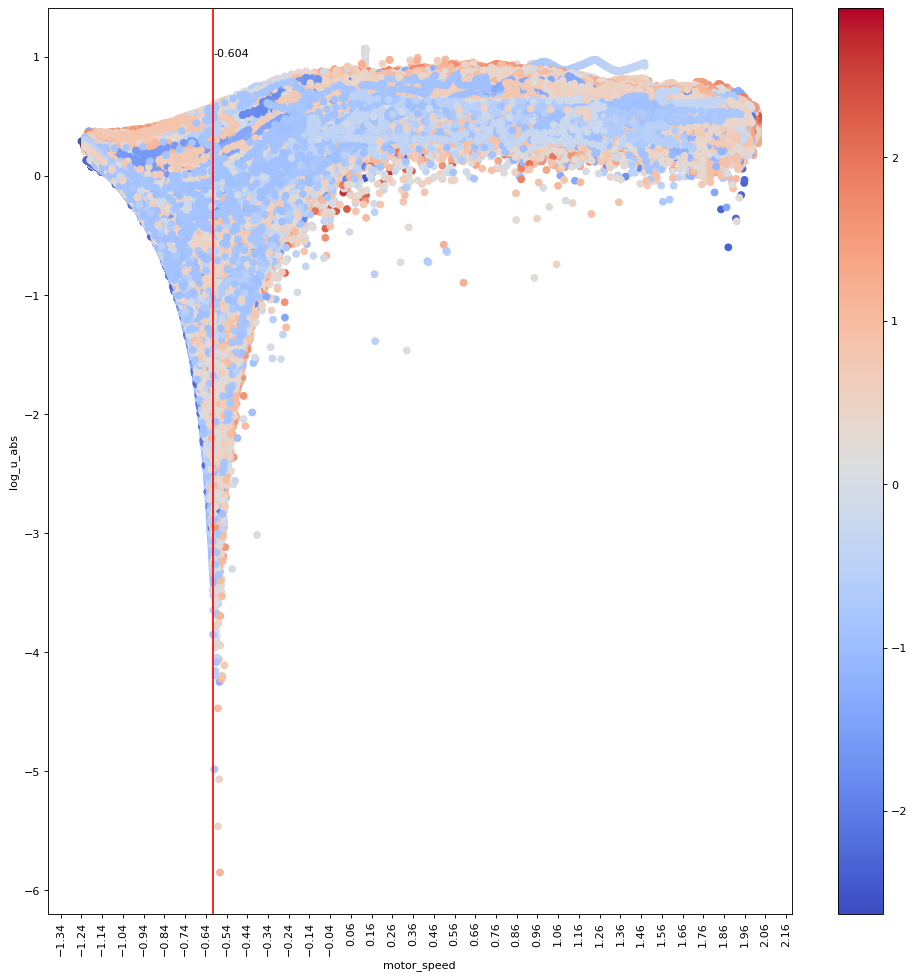

In [51]:
plt.figure(figsize=(15, 15), dpi=80)
plt.xticks(np.arange(np.min(train['motor_speed'])-0.5, np.max(train['motor_speed'])+0.5, step=0.1), rotation=90)
plt.scatter(train['motor_speed'], train['log_u_abs'], c=train['pm'], cmap=cm.coolwarm)
plt.colorbar()
cut_point = np.min(train['motor_speed'].iloc[train['log_u_abs'].nsmallest(30).index])
plt.xlabel('motor_speed')
plt.ylabel('log_u_abs')
plt.axvline(x=cut_point, c='r')
plt.text(cut_point,1,np.round(cut_point, 3))
plt.show()

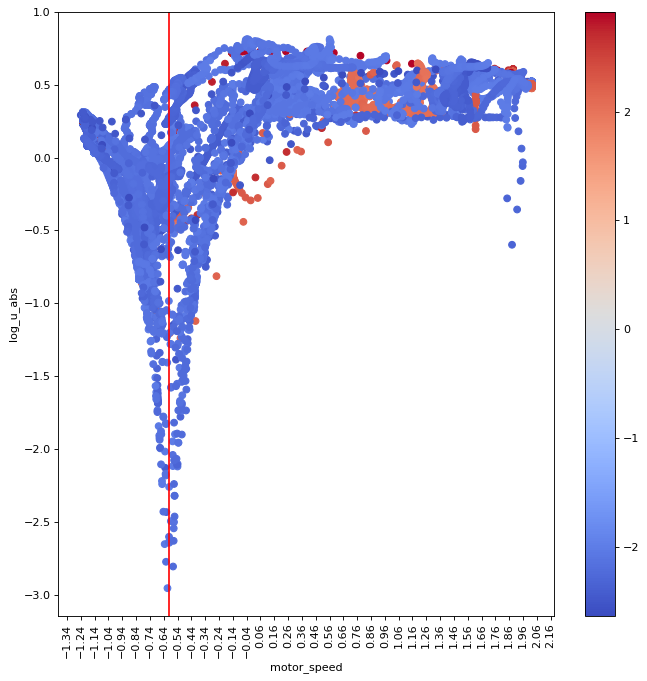

In [42]:
plt.figure(figsize=(10, 10), dpi=80)
plt.xticks(np.arange(np.min(train_extreme['motor_speed'])-0.5, np.max(train_extreme['motor_speed'])+0.5, step=0.1), rotation=90)
plt.scatter(train_extreme['motor_speed'], train_extreme['log_u_abs'], c=train_extreme['pm'], cmap=cm.coolwarm)
plt.colorbar()
# cut_point = np.min(train_extreme['motor_speed'].iloc[train_extreme['log_u_abs'].nsmallest(30).index])
plt.xlabel('motor_speed')
plt.ylabel('log_u_abs')
plt.axvline(x=cut_point, c='r')


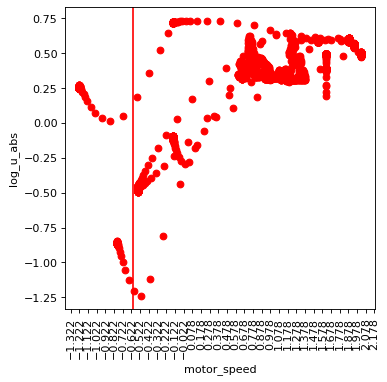

In [49]:
plt.figure(figsize=(5, 5), dpi=80)
plt.xticks(np.arange(np.min(train_extreme_hot['motor_speed'])-0.5, np.max(train_extreme_hot['motor_speed'])+0.5, step=0.1), rotation=90)
plt.scatter(train_extreme_hot['motor_speed'], train_extreme_hot['log_u_abs'], c='r')
# plt.colorbar()
# cut_point = np.min(train_extreme_hot['motor_speed'].iloc[train_extreme_hot['log_u_abs'].nsmallest(30).index])
plt.xlabel('motor_speed')
plt.ylabel('log_u_abs')
plt.axvline(x=cut_point, c='r')

# plt.xticks(np.arange(np.min(train_extreme['u_abs'])-0.5, np.max(train_extreme['u_abs'])+0.5, step=0.1), rotation=90)
# plt.scatter(train_extreme['u_abs'], train_extreme['motor_speed'])



##### **'torque' against 'motor_speed' with 'pm' temperature**
The extremely hot temperature observations are more present on the positive (right) side.

Text(-0.2907984, 2.1, '-0.291')

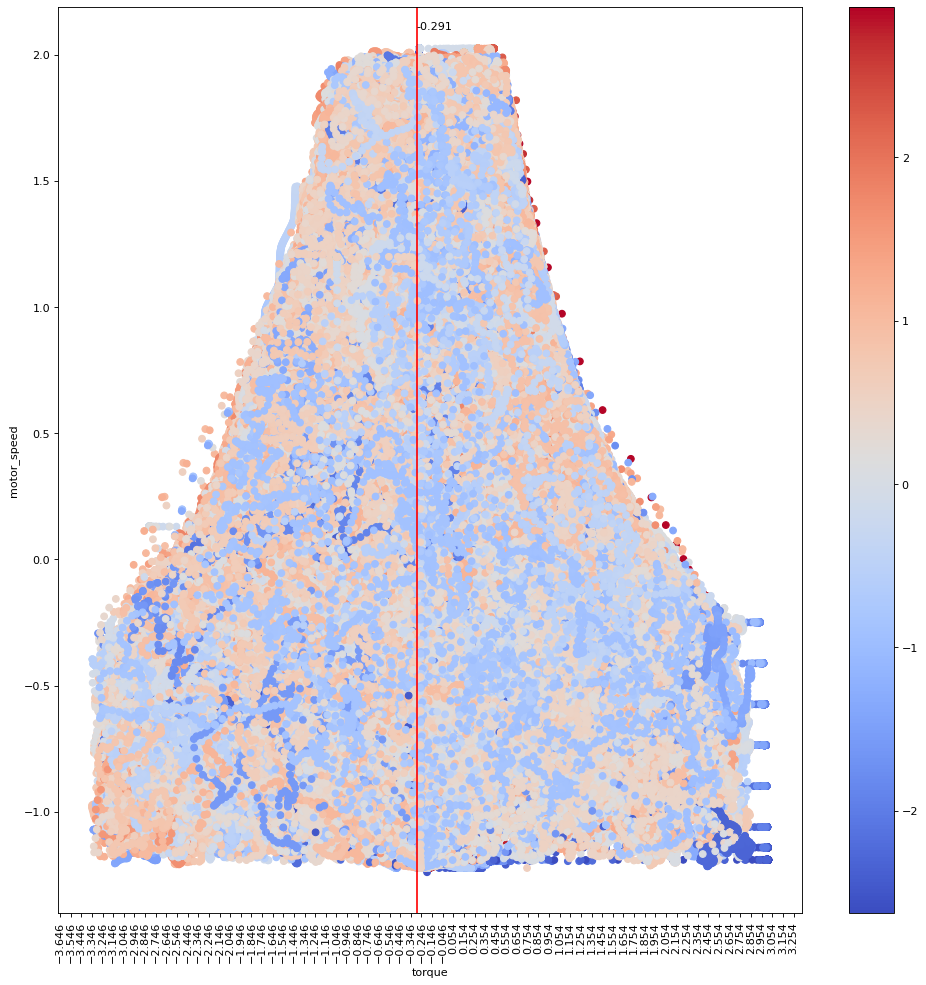

In [52]:
plt.figure(figsize=(15, 15), dpi=80)
plt.xticks(np.arange(np.min(train['torque'])-0.5, np.max(train['torque'])+0.5, step=0.1), rotation=90)
plt.scatter(train['torque'], train['motor_speed'], c=train['pm'], cmap=cm.coolwarm)
plt.colorbar()
cut_point = np.min(train['torque'].iloc[train['motor_speed'].nsmallest(30).index])
plt.xlabel('torque')
plt.ylabel('motor_speed')
plt.axvline(x=cut_point, c='r')
plt.text(cut_point,2.1,np.round(cut_point, 3))


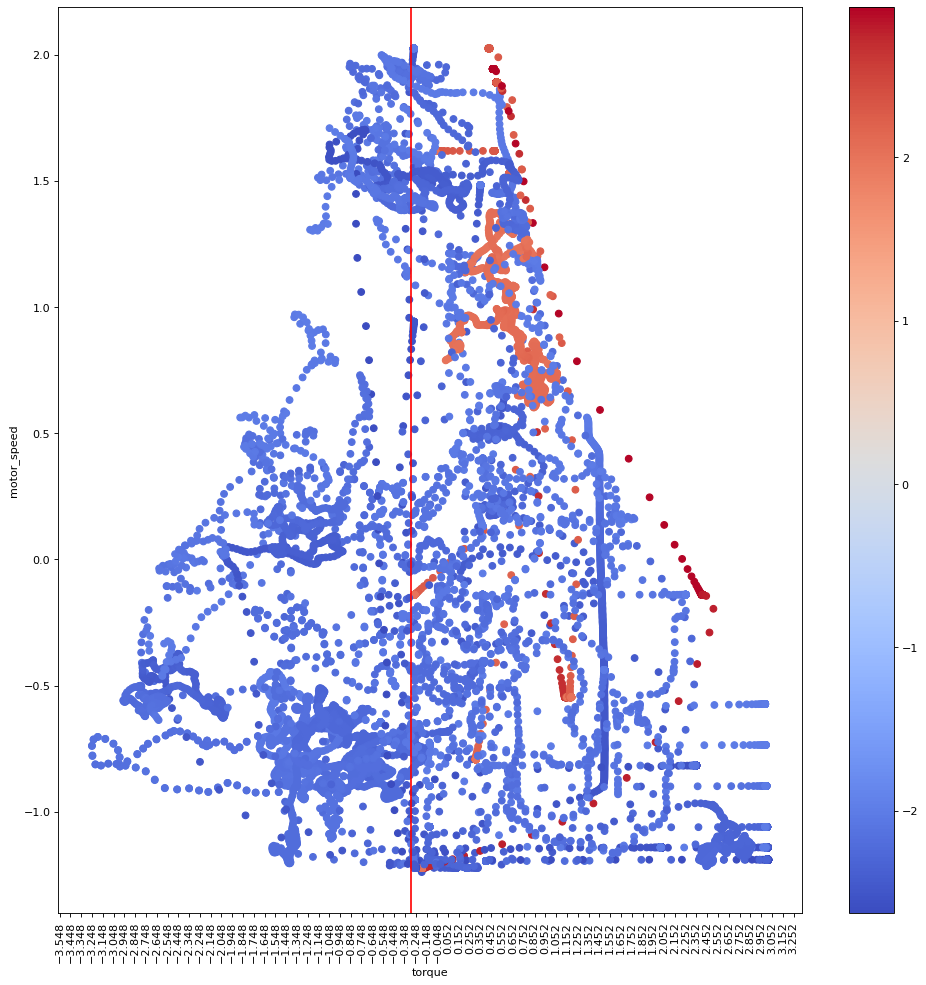

In [38]:
plt.figure(figsize=(15, 15), dpi=80)
plt.xticks(np.arange(np.min(train_extreme['torque'])-0.5, np.max(train_extreme['torque'])+0.5, step=0.1), rotation=90)
plt.scatter(train_extreme['torque'], train_extreme['motor_speed'], c=train_extreme['pm'], cmap=cm.coolwarm)
plt.colorbar()
# cut_point = np.min(train_extreme['torque'].iloc[train_extreme['motor_speed'].nsmallest(30).index])
plt.xlabel('torque')
plt.ylabel('motor_speed')
plt.axvline(x=cut_point, c='r')

##### Finding cut points based on variables distributions (prominent range)

Text(-1, 128000, '-1.05')

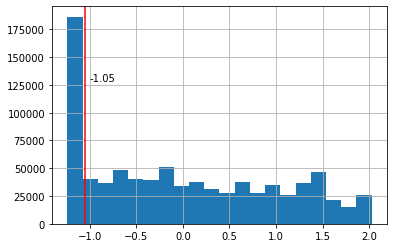

In [96]:
train['motor_speed'].hist(bins=20)
plt.axvline(x=-1.05, c='r')
plt.text(-1,128000,np.round(-1.05, 3))


Text(-0.95, 151000, '-1')

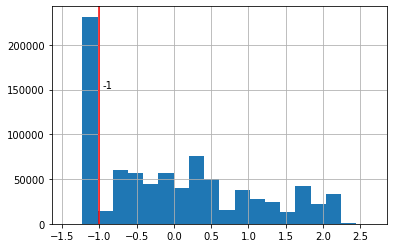

In [94]:
train['coolant'].hist(bins=20)
plt.axvline(x=-1, c='r')
plt.text(-0.95,151000,np.round(-1, 3))

######Feature (variable) Engineering based on the cut points


In [99]:
cut_point_torque_u_abs = train['torque'][train['u_abs'] ==np.min(train['u_abs'])].values[0]
cut_point_motor_log_u_abs = np.min(train['motor_speed'].iloc[train['log_u_abs'].nsmallest(30).index])
cut_point_torque_motor = np.min(train['torque'].iloc[train['motor_speed'].nsmallest(30).index])

train['cut_point_torque_u_abs'] = (train['torque']>cut_point_torque_u_abs)*train['log_u_abs']
test['cut_point_torque_u_abs'] = (test['torque']>cut_point_torque_u_abs)*test['log_u_abs']

train['cut_point_motor_log_u_abs'] = (train['motor_speed'] > cut_point_motor_log_u_abs)*train['log_u_abs']
test['cut_point_motor_log_u_abs'] = (test['motor_speed'] > cut_point_motor_log_u_abs)*test['log_u_abs']

train['cut_point_torque_motor'] = (train['torque']>cut_point_torque_motor)*train['motor_speed']
test['cut_point_torque_motor'] = (test['torque'] > cut_point_torque_motor)*test['motor_speed']

train['coolant_cut_point'] = (train['coolant']<-1)*1
test['coolant_cut_point'] = (test['coolant']<-1)*1

train['motor_speed_cut_point'] = (train['motor_speed']<-1.05)*1
test['motor_speed_cut_point'] = (test['motor_speed']<-1.05)*1

In [100]:
train.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,profile_id,u,u_abs,u_q_d_ratio,u_phase_angle,log_u_abs,i,i_abs,i_q_d_ratio,i_phase_angle,log_i_abs,pm,stator_yoke,stator_tooth,stator_winding,cut_point_torque_u_abs,cut_point_motor_log_u_abs,cut_point_torque_motor,coolant_cut_point,motor_speed_cut_point
count,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000+0.000000j,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000+0.000000j,846368.000000,8.463680e+05,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000
mean,0.082853,0.027152,0.052589,0.003834,-0.010858,-0.041547,0.026560,-0.040897,50.608782,0.052589+0.003834j,1.339636,-1.477027,-0.337409,0.211441,0.026560-0.040897j,1.275515,3.673913e+01,-0.037168,0.129908,-0.000441,0.012695,0.000753,-0.008259,0.046887,0.204203,-0.089757,0.277161,0.226737
std,0.977933,1.016069,0.996975,0.999539,1.000756,1.000715,0.987589,1.000951,23.079908,1.411750+0.000000j,0.448544,941.583550,0.913951,0.455539,1.406142+0.000000j,0.593864,3.392333e+04,0.790492,0.511023,0.991628,1.015148,1.006694,0.997647,0.283263,0.384205,0.892367,0.447597,0.418721
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.239020,-3.345953,-3.245874,-3.341639,4.000000,-1.655373-1.214851j,0.002882,-784850.191183,-1.570795,-5.849157,-3.245874-2.389300j,0.000822,-1.870778e+05,-1.570791,-7.103359,-2.628648,-1.834688,-2.066143,-2.019973,-4.982551,-5.849157,-1.239020,0.000000,0.000000
25%,-0.345336,-1.040140,-0.787199,-0.916409,-0.951889,-0.365100,-0.750257,-0.362148,30.000000,-0.787199+1.241232j,1.145498,-3.602054,-1.299997,0.135840,-0.750257-0.254400j,0.990078,-4.461250e-01,-0.419627,-0.009971,-0.656185,-0.736750,-0.761951,-0.723910,0.000000,-0.000000,-0.951870,0.000000,0.000000
50%,0.339621,-0.139105,0.292743,-0.085806,-0.140247,-0.237407,0.254701,-0.245697,56.000000,0.292743+0.726367j,1.359530,-0.520710,-0.480078,0.307139,0.254701+0.174207j,1.058085,-2.387540e-01,-0.234366,0.056460,0.083156,-0.052310,0.012339,0.009469,-0.000000,0.244289,0.000000,0.000000,0.000000
75%,0.688248,0.717035,0.404600,0.844942,0.844814,0.472951,1.013977,0.486917,68.000000,0.404600-0.441065j,1.661648,0.387675,0.369836,0.507810,1.013977-0.091446j,1.520760,5.937565e-01,0.535816,0.419210,0.684179,0.728644,0.778085,0.707115,0.146179,0.507606,0.265573,1.000000,0.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,81.000000,2.274734-1.173060j,2.912992,241462.477051,1.570792,1.069181,1.060937-0.258079j,4.030440,3.120639e+07,1.570796,1.393876,2.917456,2.449158,2.302169,2.653781,0.855584,1.069181,2.024164,1.000000,1.000000


##Evidence for different behaviour in the two sides of the coolant and motor_speed cut points

The correlations of the independent variables with the dependent variables changes when we look at the correlation heatmap after split the data into observations that are above or below both coolant and motor_speed cut points. For example, the coolant's high correleation with the temperature variables almost diminishes when we check the correlation of observations below the cut point. 

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7466: ComplexWarning: Casting complex values to real discards the imaginary part
  correl = libalgos.nancorr(ensure_float64(mat), minp=min_periods)


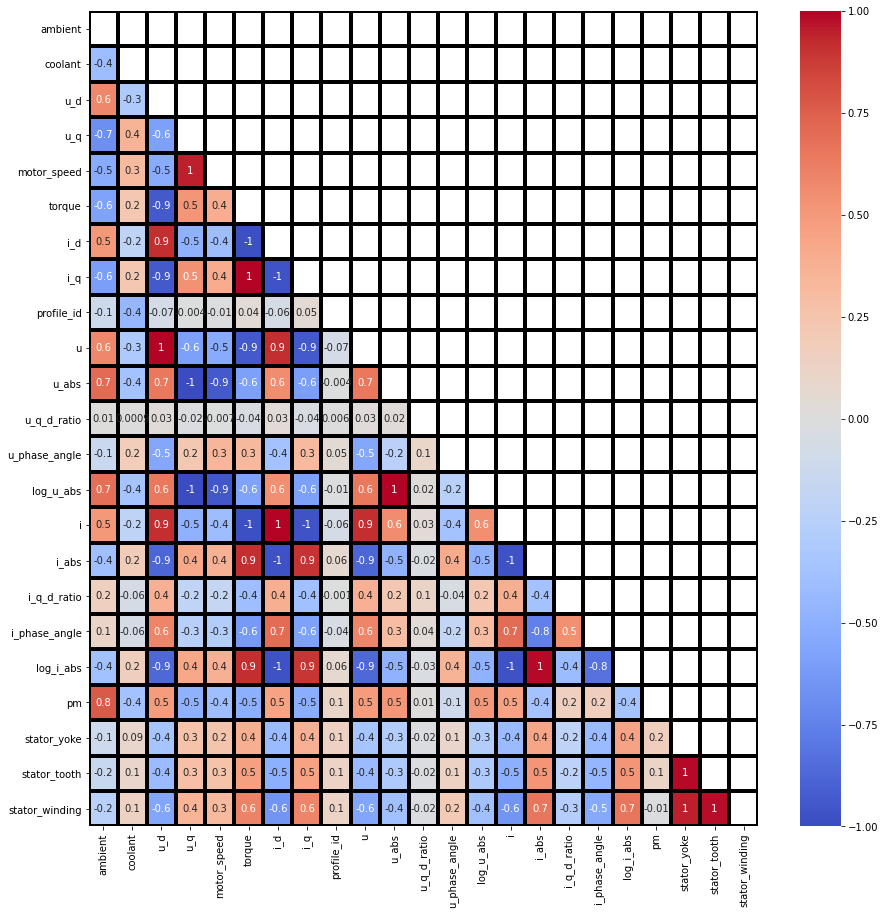

In [104]:
temp = train[(train['coolant']<=-1)&(train['motor_speed']<=-1.05)]
correlation_heatmap(temp, columns_to_exclude=['cut_point_torque_u_abs',
                                              'cut_point_motor_log_u_abs',
                                              'cut_point_torque_motor',
                                              'coolant_cut_point',
                                              'motor_speed_cut_point'])

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7466: ComplexWarning: Casting complex values to real discards the imaginary part
  correl = libalgos.nancorr(ensure_float64(mat), minp=min_periods)


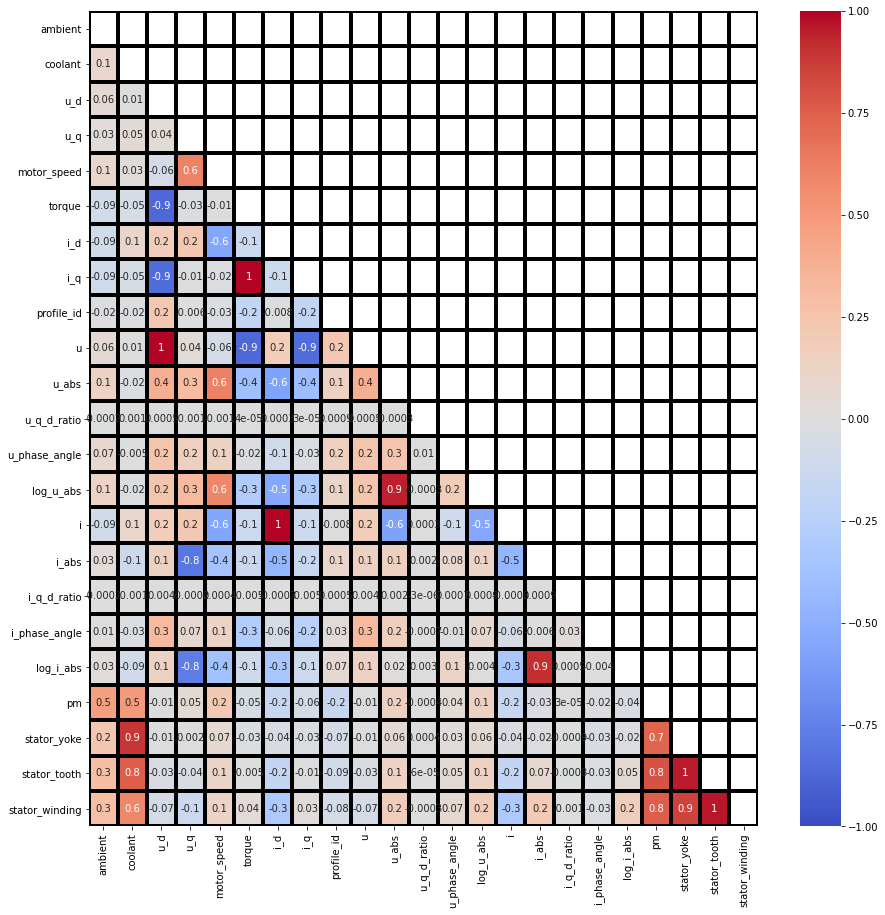

In [105]:
temp = train[(train['coolant']>-1)&(train['motor_speed']>-1.05)]
correlation_heatmap(temp, columns_to_exclude=['cut_point_torque_u_abs',
                                              'cut_point_motor_log_u_abs',
                                              'cut_point_torque_motor',
                                              'coolant_cut_point',
                                              'motor_speed_cut_point'])

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7466: ComplexWarning: Casting complex values to real discards the imaginary part
  correl = libalgos.nancorr(ensure_float64(mat), minp=min_periods)


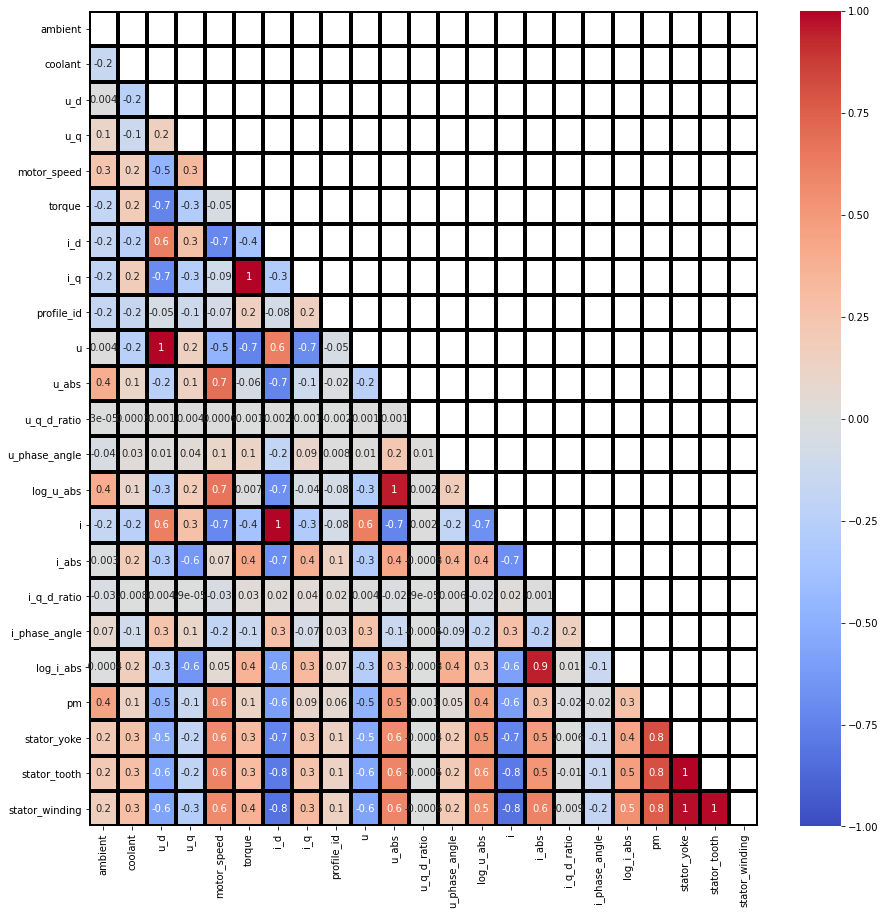

In [108]:
temp = train[(train['coolant']<=-1)&(train['motor_speed']>-1.05)]
correlation_heatmap(temp, columns_to_exclude=['cut_point_torque_u_abs',
                                              'cut_point_motor_log_u_abs',
                                              'cut_point_torque_motor',
                                              'coolant_cut_point',
                                              'motor_speed_cut_point'])

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7466: ComplexWarning: Casting complex values to real discards the imaginary part
  correl = libalgos.nancorr(ensure_float64(mat), minp=min_periods)


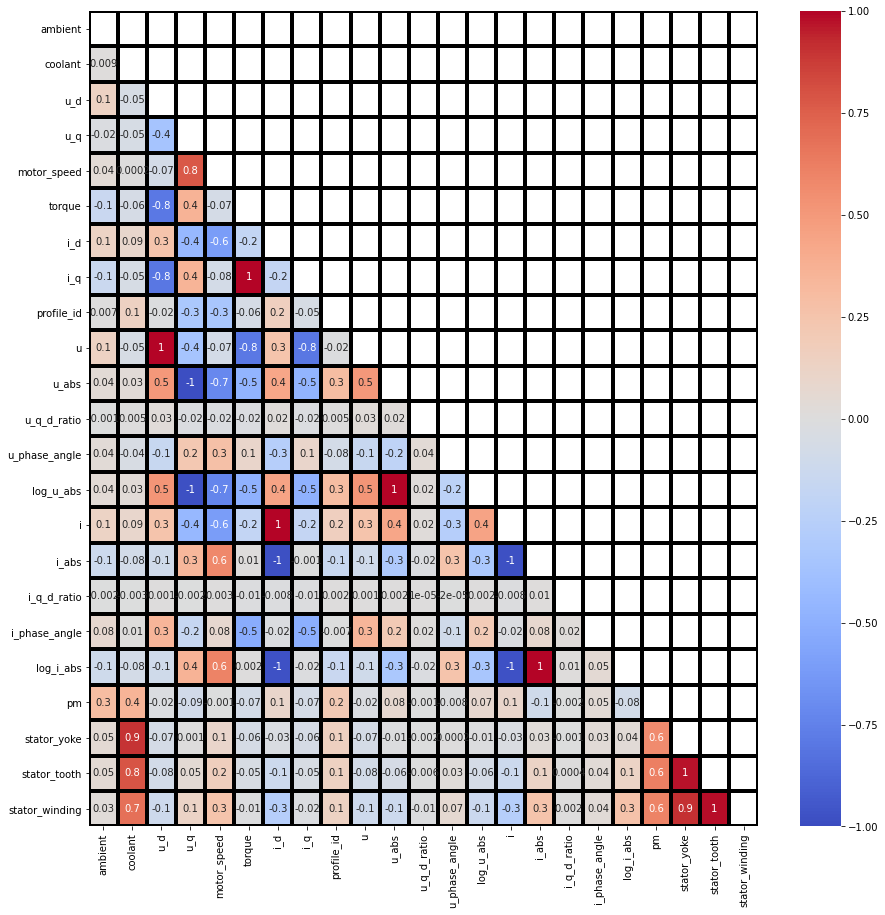

In [109]:
temp = train[(train['coolant']>-1)&(train['motor_speed']<=-1.05)]
correlation_heatmap(temp, columns_to_exclude=['cut_point_torque_u_abs',
                                              'cut_point_motor_log_u_abs',
                                              'cut_point_torque_motor',
                                              'coolant_cut_point',
                                              'motor_speed_cut_point'])

### 4d plot
I want to see if this problem can be solved with simple linear regrssion. I took 3 high correlated features (ambient, coolant, motor_speed) and I plotted a 3D scatter plot. I added the temperature as the color of each observation. 
It seems that the hot and cold observations can be seperated with a linear line roughly by only theses 3 variables. 
It is interesting to see that the hottest temperature observations are actually in the "area" of the cooler observations. 

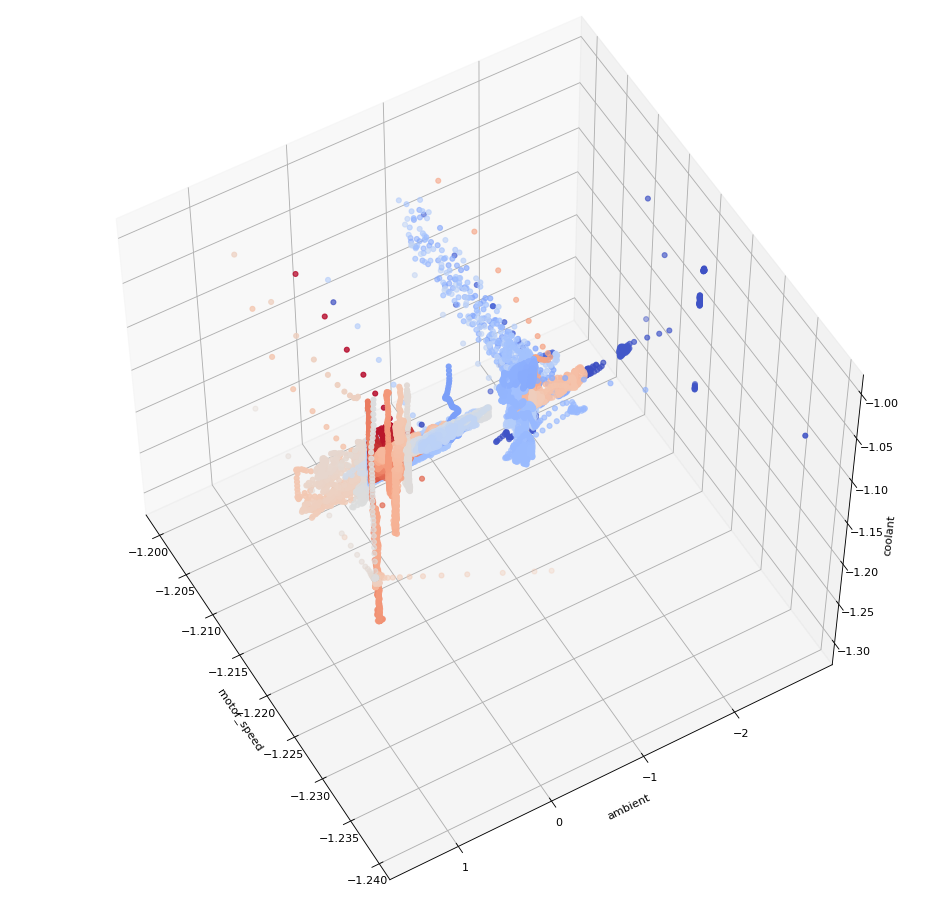

In [119]:
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=(15, 15), dpi=80)
ax = plt.axes(projection='3d')

# Data for three-dimensional scattered points
zdata = train['coolant'][(train['coolant']<-1)&(train['motor_speed']<-1.2)]
xdata = train['motor_speed'][(train['coolant']<-1)&(train['motor_speed']<-1.2)]
y_ratio = train['motor_speed']/train['coolant']
ydata = train['ambient'][(train['coolant']<-1)&(train['motor_speed']<-1.2)]
ax.scatter3D(xdata, ydata, zdata, c=train['pm'][(train['coolant']<-1)&(train['motor_speed']<-1.2)], cmap=cm.coolwarm);
ax.set_xlabel('motor_speed')
ax.set_ylabel('ambient')
ax.set_zlabel('coolant');
ax.view_init(55,150)

plt.show()

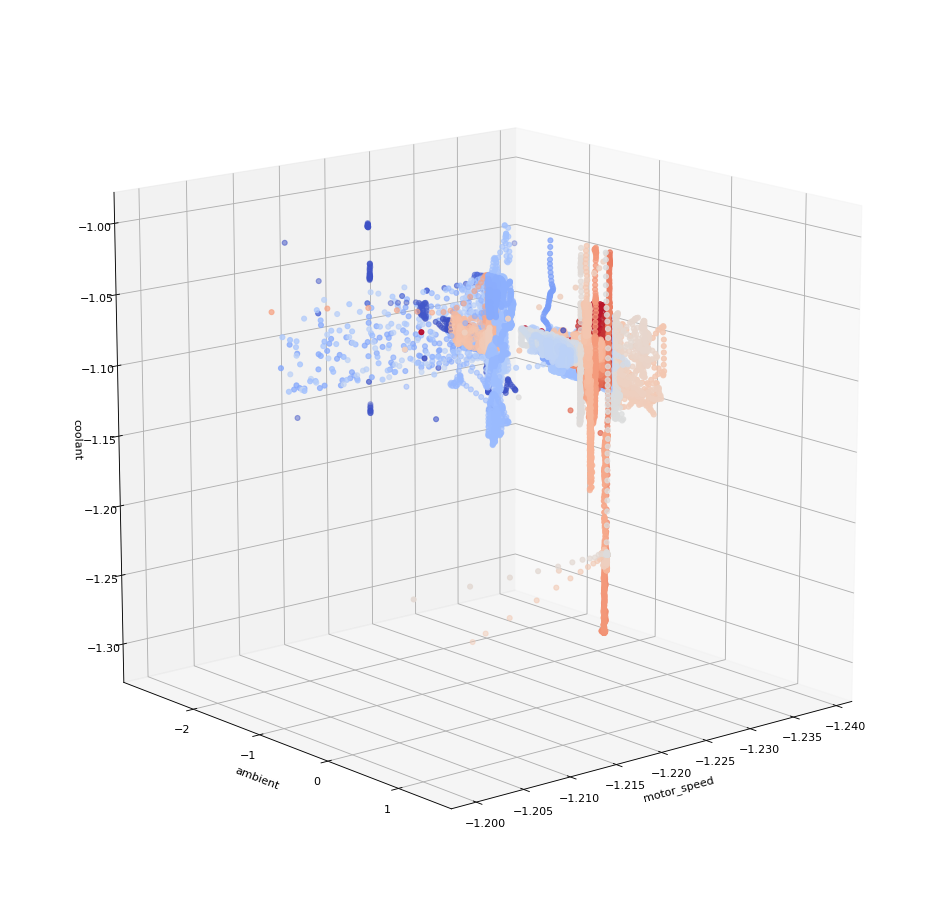

In [113]:
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=(15, 15), dpi=80)
ax = plt.axes(projection='3d')

# Data for three-dimensional scattered points
zdata = train['coolant'][(train['coolant']<-1)&(train['motor_speed']<-1.2)]
xdata = train['motor_speed'][(train['coolant']<-1)&(train['motor_speed']<-1.2)]
y_ratio = train['motor_speed']/train['coolant']
ydata = train['ambient'][(train['coolant']<-1)&(train['motor_speed']<-1.2)]
ax.scatter3D(xdata, ydata, zdata, c=train['pm'][(train['coolant']<-1)&(train['motor_speed']<-1.2)], cmap=cm.coolwarm);
ax.set_xlabel('motor_speed')
ax.set_ylabel('ambient')
ax.set_zlabel('coolant');
ax.view_init(15,50)

plt.show()

#Model

##Baseline model

The high correlation between the temperature variables led me to the idea of "gradual" model.    
I create a different model for each one of the 4 temperature variables.   
I choose the best model (lowest RMSE), and I use the predictions of this model as an independent variable in the models of the other 3 temperature variables. 

In other words:   
first stage:   
y1=f(X)+error (best model)   
y2=h(x)+error   
y3=g(x)+error   
y4=j(x)+error   

second stage:   
y2=h(x + f(x))+error   
y3=g(x + f(x))+error   
y4=j(x + f(x))+error

###Functions for prediction and plotting the results

In [125]:

def train_and_predict(X, y, X_test, y_test, model = False, exp = False, CV_5_stratified = False):
  
  if exp:
    y = np.exp(y)
    y_test = np.exp(y_test)
  bins = np.linspace(np.min(y), np.max(y), 10) 
  y_binned = np.digitize(y, bins)
  skf = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
  skf.get_n_splits(X, y_binned)
  
  if not model:
    model = LinearRegression()
 
  if CV_5_stratified:
    for train_index, test_index in skf.split(X, y_binned):
      X_train, X_valid = X.iloc[train_index], X.iloc[test_index]
      y_train, y_valid = y.iloc[train_index], y.iloc[test_index]
      model.fit(X_train, y_train)
      coeff_df = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])  
      print(coeff_df)
      
      y_train_predict = model.predict(X_train)
      y_valid_predict = model.predict(X_valid)
      y_test_predict = model.predict(X_test)
      
      if exp:
        for prediction in (y_train_predict, y_valid_predict, y_test_predict):
          low_values_flags = prediction <= 0  # Where values are low
          prediction[low_values_flags] = 0.01  # All low values set to 0

      
        print(f' RMSE training set: {rmse(np.log(y_train_predict), np.log(y_train), squared = False)}\
              \n RMSE validation set: {rmse(np.log(y_valid_predict), np.log(y_valid), squared = False)}\
              \n RMSE test set: {rmse(np.log(y_test_predict), np.log(y_test), squared = False)} \n')
      else:
        print(f' RMSE training set: {rmse(y_train_predict, y_train, squared = False)}\
              \n RMSE validation set: {rmse(y_valid_predict, y_valid, squared = False)}\
              \n RMSE test set: {rmse(y_test_predict, y_test, squared = False)} \n')
    return y_train_predict, y_test_predict, y_valid, y_valid_predict
  
  else:
    model.fit(X, y)
    coeff_df = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])  
    print(coeff_df)
    
    y_train_predict = model.predict(X)
    y_test_predict = model.predict(X_test)
    
    if exp:
      for prediction in (y_train_predict, y_test_predict):
        low_values_flags = prediction <= 0  # Where values are low
        prediction[low_values_flags] = 0.01  # All low values set to 0
      
      print(f' RMSE training set: {rmse(np.log(y_train_predict), np.log(y_train), squared = False)}\
            \n RMSE test set: {rmse(np.log(y_test_predict), np.log(y_test), squared = False)} \n')
    else:
      print(f' RMSE training set: {rmse(y_train_predict, y, squared = False)}\
            \n RMSE test set: {rmse(y_test_predict, y_test, squared = False)} \n')

    return y_train_predict, y_test_predict



In [126]:
def plot_y(y, y_predict, bins = 60):
  toatl_y = y.append(y_predict)
  count, bin_edges = np.histogram(toatl_y, bins)
  y.plot(kind='hist',
          figsize=(50, 15), 
          bins=bin_edges,
          xticks=bin_edges,
          color='red',
          xlim=(np.min(toatl_y), np.max(toatl_y))
         )
  plt.hist(y_predict, bins = bin_edges, alpha = 0.3, color = 'darkslateblue')
  plt.xticks(fontsize=16,  rotation=20)

In [127]:
def plot_y_diff(y, y_predict, bins = 60):
  toatl_y = y-y_predict
  count, bin_edges = np.histogram(toatl_y, bins)
  toatl_y.plot(kind='hist',
          figsize=(50, 15), 
          bins=bin_edges,
          xticks=bin_edges,
          color='red',
          xlim=(np.min(toatl_y), np.max(toatl_y))
         )
  
  plt.xticks(fontsize=16,  rotation=20)

###Set Features

In [155]:
X_columns = ['ambient', 'coolant', 'motor_speed', 'torque', 'log_u_abs', 
             'u_phase_angle', 'log_i_abs', 'i_phase_angle',  
             'cut_point_torque_u_abs', 'cut_point_motor_log_u_abs',
             'cut_point_torque_motor', 'coolant_cut_point', 
             'motor_speed_cut_point']

y_4_columns= ['pm', 'stator_yoke', 'stator_tooth', 'stator_winding']
X_train = train[X_columns]
y_4_train = train[y_4_columns]
X_test = test[X_columns]
y_4_test = test[y_4_columns]

# Does adding the predictions is good as adding the real value?
# X_columns.append('pm')
# X_train_pm = train[X_columns]
# X_test_pm = test[X_columns]
# X_columns.remove('pm')
# X_columns.append('stator_yoke')
# X_train_yoke = train[X_columns]
# X_test_yoke = test[X_columns]

### Baseline Model, MLR with 5-PCA for each temperature variable
There is no leaderboard so I needed to create some "baseline" that I can "compete" against it. 
I have started with a linear regression on 5 principal compnents. 
I used cross validation of 5 stratified folds.

In [130]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5)
principalComponents = pca.fit_transform(X_train)
principalDf = pd.DataFrame(data = principalComponents
            #  , columns = ['pc_1', 'pc_2', 'pc_3'])
             , columns = ['pc_1', 'pc_2', 'pc_3', 'pc_4', 'pc_5'])


print(f'The sum of the explained variance in the training set by 3 PCA is {sum(pca.explained_variance_ratio_)}')
principalComponents_test = pca.fit_transform(X_test)
principalDf_test = pd.DataFrame(data = principalComponents_test
            #  , columns = ['pc_1', 'pc_2', 'pc_3'])
            , columns = ['pc_1', 'pc_2', 'pc_3', 'pc_4', 'pc_5'])

print(f'The sum of the explained variance in the test set by 5 PCA is {sum(pca.explained_variance_ratio_)}')

The sum of the explained variance in the training set by 3 PCA is 0.8293446133395314
The sum of the explained variance in the test set by 5 PCA is 0.8916986539274757


In [131]:
y_train_PCA_predict = pd.DataFrame()
y_test_PCA_predict = pd.DataFrame()
y_valid_PCA = pd.DataFrame()
y_valid_PCA_predict = pd.DataFrame()
for temperature in y_4_columns:
  print(f'Model results for {temperature}: \n')
  y = y_4_train[temperature]
  y_test = y_4_test[temperature]
  y_train_PCA_predict[temperature], y_test_PCA_predict[temperature], y_valid_PCA[temperature], y_valid_PCA_predict[temperature] = train_and_predict(X = principalDf, y = y, X_test = principalDf_test, y_test = y_test, model = False, exp = False, CV_5_stratified = True)


Model results for pm: 



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


      Coefficient
pc_1     0.239455
pc_2    -0.406375
pc_3    -0.217731
pc_4    -0.000499
pc_5    -0.077817
 RMSE training set: 0.7194405940159576              
 RMSE validation set: 0.9063211756420979              
 RMSE test set: 1.1665902341584324 

      Coefficient
pc_1     0.263876
pc_2    -0.344046
pc_3    -0.225479
pc_4     0.098411
pc_5    -0.065486
 RMSE training set: 0.7594886095489733              
 RMSE validation set: 0.7167057717923754              
 RMSE test set: 1.1416684183459236 

      Coefficient
pc_1     0.270623
pc_2    -0.348778
pc_3    -0.233621
pc_4     0.067748
pc_5    -0.054664
 RMSE training set: 0.7772945174399409              
 RMSE validation set: 0.6325687422910786              
 RMSE test set: 1.1406361656945923 

      Coefficient
pc_1     0.260946
pc_2    -0.338470
pc_3    -0.223207
pc_4     0.072904
pc_5    -0.070666
 RMSE training set: 0.7649642168099202              
 RMSE validation set: 0.6937443956297342              
 RMSE test set: 1.1306739

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


      Coefficient
pc_1     0.163957
pc_2    -0.594207
pc_3    -0.393465
pc_4    -0.169131
pc_5     0.452890
 RMSE training set: 0.38615468733215935              
 RMSE validation set: 0.6717700690094837              
 RMSE test set: 0.932363110673129 

      Coefficient
pc_1     0.202148
pc_2    -0.507936
pc_3    -0.419827
pc_4    -0.132006
pc_5     0.456209
 RMSE training set: 0.44512087196139316              
 RMSE validation set: 0.4109709768704326              
 RMSE test set: 0.833762468576508 

      Coefficient
pc_1     0.202116
pc_2    -0.504225
pc_3    -0.423529
pc_4    -0.152965
pc_5     0.443424
 RMSE training set: 0.44583093481116687              
 RMSE validation set: 0.40805266574388716              
 RMSE test set: 0.8326856344733818 

      Coefficient
pc_1     0.197112
pc_2    -0.504173
pc_3    -0.416928
pc_4    -0.150433
pc_5     0.436521
 RMSE training set: 0.44939955070302634              
 RMSE validation set: 0.39302677406021047              
 RMSE test set: 0.834

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


      Coefficient
pc_1     0.241726
pc_2    -0.519578
pc_3    -0.352170
pc_4    -0.182141
pc_5     0.306700
 RMSE training set: 0.5219451324463967              
 RMSE validation set: 0.9938445531313881              
 RMSE test set: 1.0775906173543055 

      Coefficient
pc_1     0.300736
pc_2    -0.376356
pc_3    -0.370221
pc_4    -0.100776
pc_5     0.319002
 RMSE training set: 0.6189777237945739              
 RMSE validation set: 0.5577071688705577              
 RMSE test set: 0.9455001184220648 

      Coefficient
pc_1     0.294216
pc_2    -0.371199
pc_3    -0.389675
pc_4    -0.126966
pc_5     0.312228
 RMSE training set: 0.6193127386436535              
 RMSE validation set: 0.5568021046526146              
 RMSE test set: 0.9314003651205627 

      Coefficient
pc_1     0.286755
pc_2    -0.364403
pc_3    -0.396137
pc_4    -0.119336
pc_5     0.307206
 RMSE training set: 0.6187341480675822              
 RMSE validation set: 0.5615595364918636              
 RMSE test set: 0.9211659

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


      Coefficient
pc_1     0.289242
pc_2    -0.349846
pc_3    -0.329942
pc_4    -0.192185
pc_5     0.193545
 RMSE training set: 0.6753364182328162              
 RMSE validation set: 0.9311257494781571              
 RMSE test set: 1.1878643592842664 

      Coefficient
pc_1     0.321500
pc_2    -0.272848
pc_3    -0.328060
pc_4    -0.095861
pc_5     0.223466
 RMSE training set: 0.6995849953357399              
 RMSE validation set: 0.784804474694157              
 RMSE test set: 1.1321639683616782 

      Coefficient
pc_1     0.331323
pc_2    -0.246901
pc_3    -0.361760
pc_4    -0.121685
pc_5     0.187726
 RMSE training set: 0.713775071852574              
 RMSE validation set: 0.7296968109021348              
 RMSE test set: 1.1028661649517446 

      Coefficient
pc_1     0.313960
pc_2    -0.215343
pc_3    -0.367011
pc_4    -0.120449
pc_5     0.211204
 RMSE training set: 0.7382042988746371              
 RMSE validation set: 0.6317908987844234              
 RMSE test set: 1.071377316

The RMSE score of each set (training, validation, and test) looks stable. The coeeficients of each PC are also stable for each temperature. there are large gaps between the scores (the score of the training set is the lowest), which indicates that the model might overfit the training set. In cases that the training and validation scores are approximately the same, but the score in the test set is high it means that the model can't generalize well.

## Fully Connected Network

This is a simple Fully connected network. 
The activation function between the layers is tanh. 
The tanh(x) result is between (-1,1), the temperature results are between (-3,3), therefore in the last layer I used a costume activation function (tanh(x) * 3). 
The optimizer is stochastic gradient descent (sgd). 

In [178]:
X_columns = ['ambient', 'coolant', 'motor_speed', 'torque', 'log_u_abs', 
             'u_phase_angle', 'log_i_abs', 'i_phase_angle',  
             'cut_point_torque_u_abs', 'cut_point_motor_log_u_abs',
             'cut_point_torque_motor', 'coolant_cut_point', 
             'motor_speed_cut_point']
y_4_columns= ['pm', 'stator_yoke', 'stator_tooth', 'stator_winding']
X_train = train[X_columns]
y_4_train = train[y_4_columns]
X_test = test[X_columns]
y_4_test = test[y_4_columns]

In [179]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation
import tensorflow.keras.backend as K

def custom_activation(x):
    return (K.tanh(x) * 3)


# Create 4 layers
model = Sequential()
model.add(keras.Input(shape=(13)))
model.add(Dense(13, activation="tanh"))
model.add(Dense(6, activation="tanh"))
model.add(Dense(6, activation="tanh"))
model.add(Dense(6, activation="tanh"))
model.add(Dense(1))
model.add(Activation(custom_activation, name='3tanh'))


model.compile(optimizer='sgd', loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])

In [180]:
y_train = train['stator_yoke']
model.fit(X_train,y_train,epochs = 10)

Epoch 1/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.1345 - root_mean_squared_error: 0.3667
Epoch 2/10
26449/26449 [==============================] - 56s 2ms/step - loss: 0.1249 - root_mean_squared_error: 0.3534
Epoch 3/10
26449/26449 [==============================] - 58s 2ms/step - loss: 0.1223 - root_mean_squared_error: 0.3497
Epoch 4/10
26449/26449 [==============================] - 56s 2ms/step - loss: 0.1207 - root_mean_squared_error: 0.3475
Epoch 5/10
26449/26449 [==============================] - 56s 2ms/step - loss: 0.1194 - root_mean_squared_error: 0.3456
Epoch 6/10
26449/26449 [==============================] - 56s 2ms/step - loss: 0.1182 - root_mean_squared_error: 0.3439
Epoch 7/10
26449/26449 [==============================] - 56s 2ms/step - loss: 0.1174 - root_mean_squared_error: 0.3426
Epoch 8/10
26449/26449 [==============================] - 58s 2ms/step - loss: 0.1167 - root_mean_squared_error: 0.3416
Epoch 9/10
26449/26449 [================

In [181]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

y_train_pred_df=pd.DataFrame()
y_test_pred_df=pd.DataFrame()

y_train_pred_df['stator_yoke_predicted'] = y_train_pred.flatten()
y_test_pred_df['stator_yoke_predicted'] = y_test_pred.flatten()

X_train_stator_yoke = pd.concat([X_train,y_train_pred_df['stator_yoke_predicted']],axis=1)
X_test_stator_yoke = pd.concat([X_test,y_test_pred_df['stator_yoke_predicted']],axis=1)

RMSE_stator_yoke = rmse(test['stator_yoke'],y_test_pred)
RMSE_stator_yoke

0.1921759240089906

In [182]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation
import tensorflow.keras.backend as K

def custom_activation(x):
    return (K.tanh(x) * 3)

# create a new model that includes the predictions of the stator_yoke
model = Sequential()
model.add(keras.Input(shape=(14)))
model.add(Dense(14, activation="tanh"))
model.add(Dense(6, activation="tanh"))
model.add(Dense(6, activation="tanh"))
model.add(Dense(6, activation="tanh"))
model.add(Dense(1))
model.add(Activation(custom_activation, name='3tanh'))


model.compile(optimizer='sgd', loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])

In [183]:
y_train = train['pm']
model.fit(X_train_stator_yoke,y_train,epochs = 10)

Epoch 1/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.3637 - root_mean_squared_error: 0.6031
Epoch 2/10
26449/26449 [==============================] - 58s 2ms/step - loss: 0.3344 - root_mean_squared_error: 0.5783
Epoch 3/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.3246 - root_mean_squared_error: 0.5698
Epoch 4/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.3157 - root_mean_squared_error: 0.5619
Epoch 5/10
26449/26449 [==============================] - 56s 2ms/step - loss: 0.3069 - root_mean_squared_error: 0.5540
Epoch 6/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2986 - root_mean_squared_error: 0.5464
Epoch 7/10
26449/26449 [==============================] - 58s 2ms/step - loss: 0.2926 - root_mean_squared_error: 0.5409
Epoch 8/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2886 - root_mean_squared_error: 0.5372
Epoch 9/10
26449/26449 [================

In [184]:
y_train_pred_pm = model.predict(X_train_stator_yoke)
y_test_pred_pm = model.predict(X_test_stator_yoke)

y_train_pred_df['pm_predicted'] = y_train_pred_pm.flatten()
y_test_pred_df['pm_predicted'] = y_test_pred_pm.flatten()

RMSE_pm = rmse(test['pm'],y_test_pred_pm)
RMSE_pm

1.0113692586732708

In [185]:
y_train = train['stator_tooth']
model.fit(X_train_stator_yoke,y_train,epochs = 10)

Epoch 1/10
26449/26449 [==============================] - 59s 2ms/step - loss: 0.2143 - root_mean_squared_error: 0.4630
Epoch 2/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2048 - root_mean_squared_error: 0.4526
Epoch 3/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2021 - root_mean_squared_error: 0.4496
Epoch 4/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2007 - root_mean_squared_error: 0.4480
Epoch 5/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.1995 - root_mean_squared_error: 0.4467
Epoch 6/10
26449/26449 [==============================] - 58s 2ms/step - loss: 0.1984 - root_mean_squared_error: 0.4454
Epoch 7/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.1973 - root_mean_squared_error: 0.4442
Epoch 8/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.1963 - root_mean_squared_error: 0.4431
Epoch 9/10
26449/26449 [================

In [186]:
y_train_pred_tooth = model.predict(X_train_stator_yoke)
y_test_pred_tooth = model.predict(X_test_stator_yoke)

y_train_pred_df['stator_tooth_predicted'] = y_train_pred_tooth.flatten()
y_test_pred_df['stator_tooth_predicted'] = y_test_pred_tooth.flatten()

RMSE_stator_tooth = rmse(test['stator_tooth'],y_test_pred_tooth)
RMSE_stator_tooth

0.36982214023127913

In [188]:
y_train = train['stator_winding']
model.fit(X_train_stator_yoke,y_train,epochs = 10)

Epoch 1/10
26449/26449 [==============================] - 58s 2ms/step - loss: 0.2428 - root_mean_squared_error: 0.4927
Epoch 2/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2403 - root_mean_squared_error: 0.4903
Epoch 3/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2391 - root_mean_squared_error: 0.4890
Epoch 4/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2381 - root_mean_squared_error: 0.4880
Epoch 5/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2373 - root_mean_squared_error: 0.4872
Epoch 6/10
26449/26449 [==============================] - 58s 2ms/step - loss: 0.2366 - root_mean_squared_error: 0.4864
Epoch 7/10
26449/26449 [==============================] - 57s 2ms/step - loss: 0.2360 - root_mean_squared_error: 0.4858
Epoch 8/10
26449/26449 [==============================] - 56s 2ms/step - loss: 0.2355 - root_mean_squared_error: 0.4853
Epoch 9/10
26449/26449 [================

In [189]:
y_train_pred = model.predict(X_train_stator_yoke)
y_test_pred = model.predict(X_test_stator_yoke)

y_train_pred_df['stator_winding_predicted'] = y_train_pred.flatten()
y_test_pred_df['stator_winding_predicted'] = y_test_pred.flatten()

RMSE_stator_winding = rmse(test['stator_winding'],y_test_pred)
RMSE_stator_winding

0.4702368913378787

### Save and download the results

In [190]:
y_test_pred_df.to_csv('predicted_temperatures.csv', index=False)

In [191]:
from google.colab import files
files.download('predicted_temperatures.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Plot the results
Below 2 histograms for each temperature (8 histograms in total). 
The first histogram - comparison of the predicted (grey) and actual temperature (red).   
The second histogram is for the difference between the actual and predicted temperature (red).


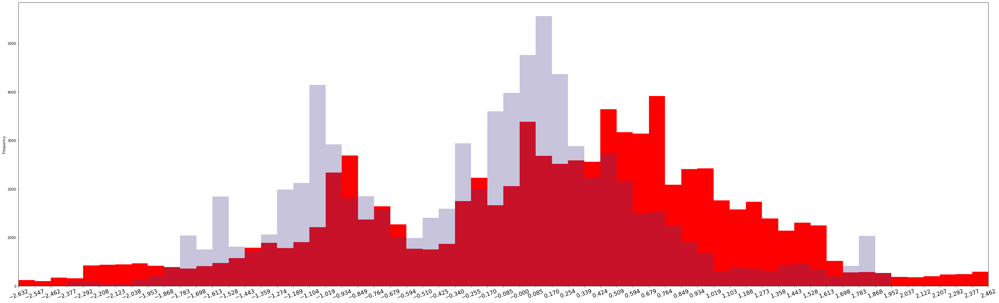

In [192]:
plot_y(test['pm'], y_test_pred_df['pm_predicted'])

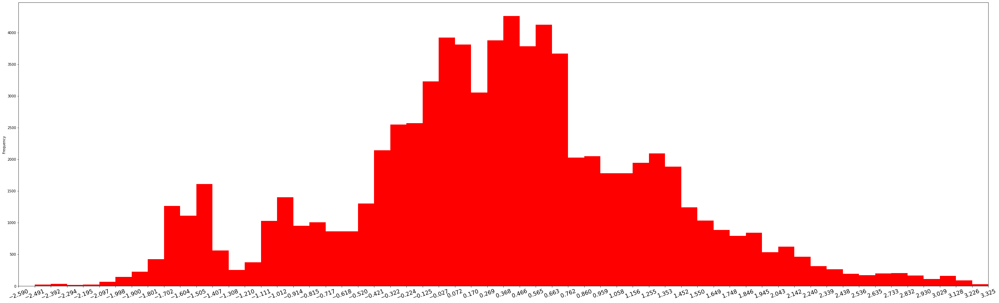

In [201]:
plot_y_diff(test['pm'], y_test_pred_df['pm_predicted'])

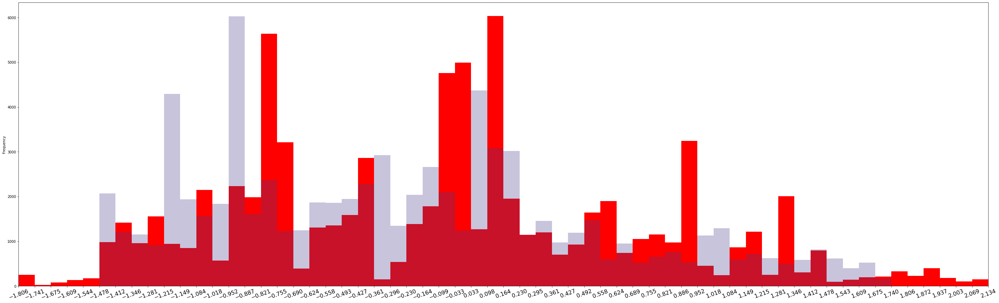

In [193]:
plot_y(test['stator_yoke'], y_test_pred_df['stator_yoke_predicted'])

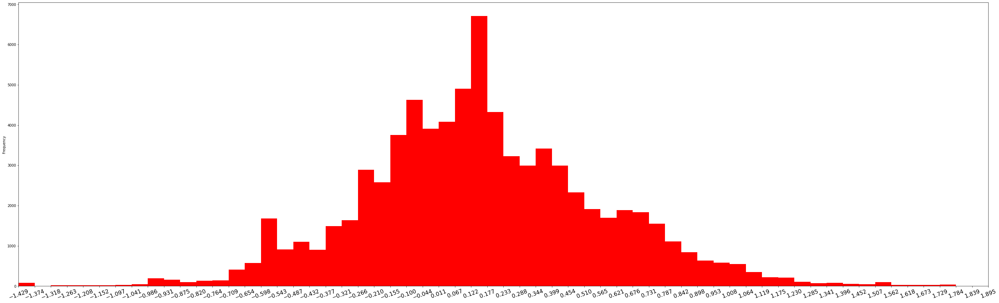

In [202]:
plot_y_diff(test['stator_yoke'], y_test_pred_df['stator_yoke_predicted'])

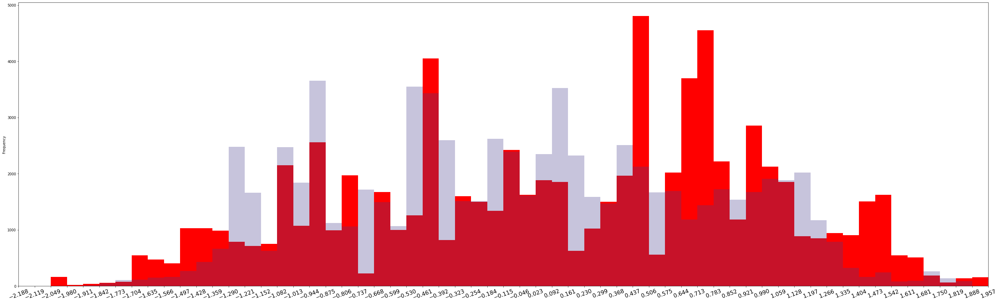

In [194]:
plot_y(test['stator_tooth'], y_test_pred_df['stator_tooth_predicted'])

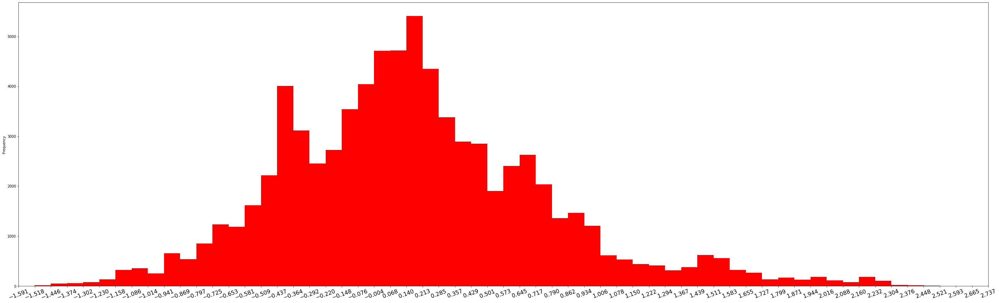

In [203]:
plot_y_diff(test['stator_tooth'], y_test_pred_df['stator_tooth_predicted'])

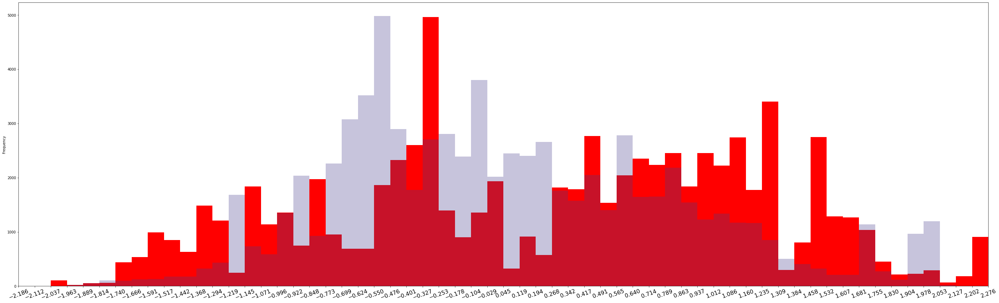

In [195]:
plot_y(test['stator_winding'], y_test_pred_df['stator_winding_predicted'])

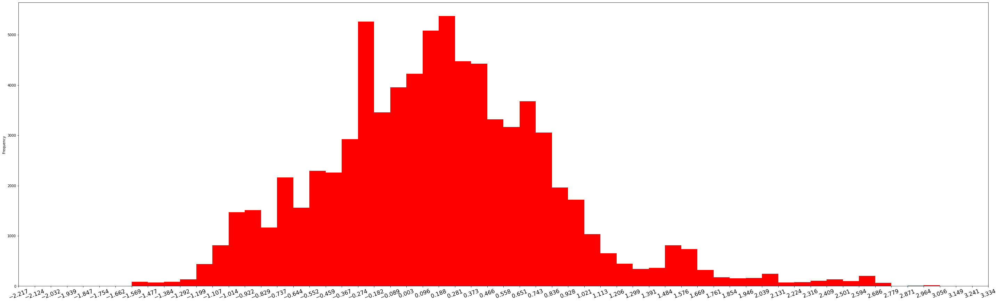

In [204]:
plot_y_diff(test['stator_winding'], y_test_pred_df['stator_winding_predicted'])